# Annotation Task Test

Test the spatial annotation workflow using MERFISH data from developing human heart.

**Data source**: Developing human heart MERFISH (Nature 2024)
- Reference: https://www.nature.com/articles/s41586-024-07171-z

## Expected Output Files
- `preprocessed.h5ad` - Normalized spatial data
- `celltype_annotated.h5ad` - Data with cell type annotations
- `utag_main_result.csv` - Spatial niche clusters
- `niche_annotated.h5ad` - Data with niche annotations
- Visualization plots

## 1. Setup

In [1]:
import os, sys, shutil

work_dir = "/home/wangh256/hanchen/Agent_dev/spatialagent_dev_agx"
os.chdir(work_dir)
sys.path.insert(0, work_dir)

# Create fresh test directory
test_save_path = os.path.join(work_dir, "experiments", "test_annotation_new")
if os.path.exists(test_save_path):
    shutil.rmtree(test_save_path)
os.makedirs(test_save_path)

print(f"Working directory: {os.getcwd()}")
print(f"Output directory: {test_save_path}")

Working directory: /gnet/is1/p01/shares/regevlab/hanchen/Agent_dev/spatialagent_dev_agx
Output directory: /home/wangh256/hanchen/Agent_dev/spatialagent_dev_agx/experiments/test_annotation_new


## 2. Configure Input Data

Using the included MERFISH dataset from developing human heart.
Data located in `data/dataset_annotation/`.

In [2]:
# ============================================================
# CONFIGURE YOUR DATA HERE
# ============================================================

# Path to spatial transcriptomics data (h5ad format)
# Using MERFISH data from dataset_annotation folder
ADATA_PATH = "./data/dataset_annotation/merfish_raw.h5ad"

# Data metadata (from readme: developing human heart)
TISSUE = "heart"
SPECIES = "human"
CONDITION = "developing"

# Anatomical reference image for niche annotation
ANATOMICAL_IMAGE = "./data/dataset_annotation/AnaImage.png"

# ============================================================

print(f"Annotation Task Configuration:")
print(f"  Data path: {ADATA_PATH}")
print(f"  Tissue: {TISSUE}")
print(f"  Species: {SPECIES}")
print(f"  Condition: {CONDITION}")
print(f"  Anatomical image: {ANATOMICAL_IMAGE}")

Annotation Task Configuration:
  Data path: ./data/dataset_annotation/merfish_raw.h5ad
  Tissue: heart
  Species: human
  Condition: developing
  Anatomical image: ./data/dataset_annotation/AnaImage.png


## 3. Initialize Agent

In [3]:
from spatialagent.agent import SpatialAgent, make_llm

llm = make_llm("claude-sonnet-4-5-20250929")
agent = SpatialAgent(
    llm=llm,
    save_path=test_save_path,
    data_path="./data",
)

print(f"Agent ready with {len(agent.tool_registry.tools)} tools")
print(f"Skills available: {agent.skill_manager.list_skills()}")

Auto-loading tools from tool modules...
  Loaded: download_czi_reference (database)
  Loaded: extract_czi_markers (database)
  Loaded: search_cellmarker2 (database)
  Loaded: search_czi_datasets (database)
  Loaded: search_panglao (database)
  Loaded: aggregate_gene_voting (analytics)
  Loaded: harmony_transfer_labels (analytics)
  Loaded: infer_cell_cell_interactions (analytics)
  Loaded: infer_dynamics (analytics)
  Loaded: preprocess_spatial_data (analytics)
  Loaded: run_utag_clustering (analytics)
  Loaded: summarize_celltypes (analytics)
  Loaded: summarize_conditions (analytics)
  Loaded: summarize_tissue_regions (analytics)
  Loaded: annotate_cell_types (interpretation)
  Loaded: annotate_tissue_niches (interpretation)
  Loaded: finalize_gene_panel (interpretation)
  Loaded: generate_scientific_report (interpretation)
  Loaded: interpret_figure (interpretation)
  Loaded: score_gene_importance (interpretation)
  Loaded: inspect_tool_code (support_tools)
  Loaded: execute_bash (c

## 4. Run Annotation Task

Annotate cell types and tissue niches in the spatial data.

Running annotation workflow...
<user query> 
Annotate the spatial transcriptomics data at './data/dataset_annotation/merfish_raw.h5ad'.

This is human heart data (developing).
Anatomical reference image: './data/dataset_annotation/AnaImage.png'

Save results to '/home/wangh256/hanchen/Agent_dev/spatialagent_dev_agx/experiments/test_annotation_new'.
 </user query>

<tool> retrieved preprocess_spatial_data; annotate_tissue_niches; download_czi_reference; interpret_figure; annotate_cell_types; summarize_celltypes; summarize_tissue_regions; generate_scientific_report; aggregate_gene_voting; search_cellmarker2 </tool>

<skill> retrieved annotation </skill>

I'll help you annotate the spatial transcriptomics data for the developing human heart. Let me follow the workflow systematically.

<think>
I need to annotate spatial transcriptomics data from a developing human heart. The workflow involves:
1. Preprocessing the data
2. Finding and downloading a reference dataset from CZI
3. Transferring

INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:sklearn.KMeans initialization complete.
INFO:harmonypy:Iteration 1 of 10
INFO:harmonypy:Iteration 2 of 10
INFO:harmonypy:Converged after 2 iterations


<observation>
Output:
Successfully transferred labels using Harmony. Saved to /home/wangh256/hanchen/Agent_dev/spatialagent_dev_agx/experiments/test_annotation_new/celltype_transferred.csv
2025-12-21 03:16:12,134 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-12-21 03:16:28,974 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-12-21 03:16:30,232 - harmonypy - INFO - Iteration 1 of 10
2025-12-21 03:17:34,571 - harmonypy - INFO - Iteration 2 of 10
2025-12-21 03:18:39,309 - harmonypy - INFO - Converged after 2 iterations

</observation>


<think>
Excellent! Harmony integration has converged after 2 iterations and transferred the cell type labels. Now I need to annotate the cell types using the hierarchical two-level approach. I'll use the annotate_cell_types tool with the transferred labels.
</think>

<act>
# Step 5: Annotate cell types hierarchically
result = annotate_cell_types({
    "adata_path": "/home/wangh256/hanchen/Agent_dev/spatialage

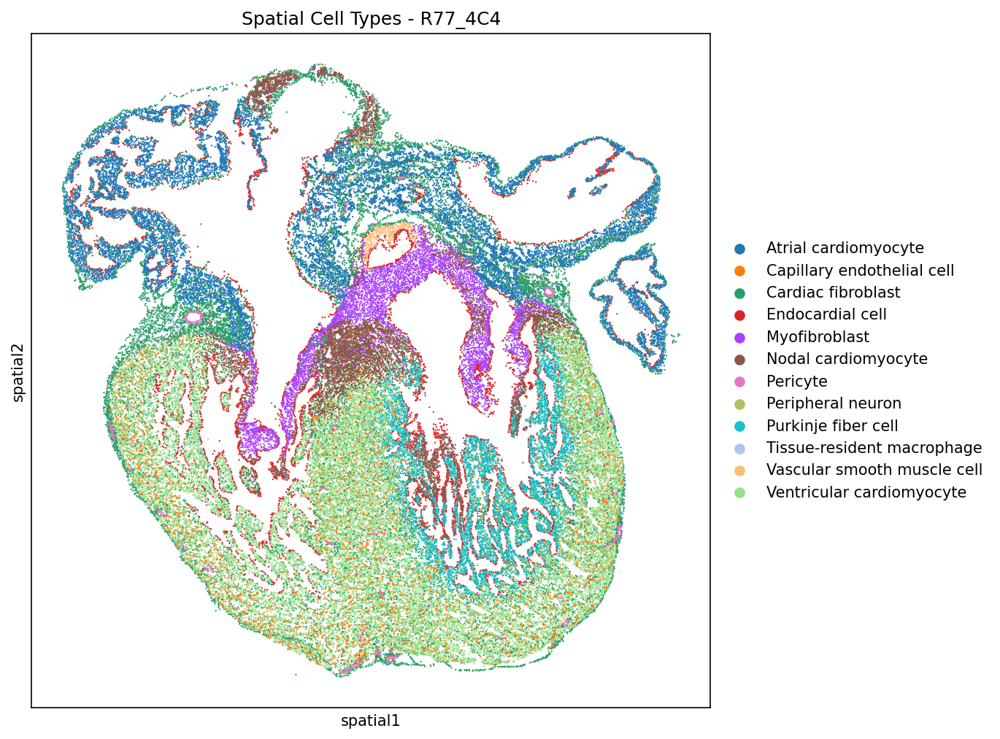

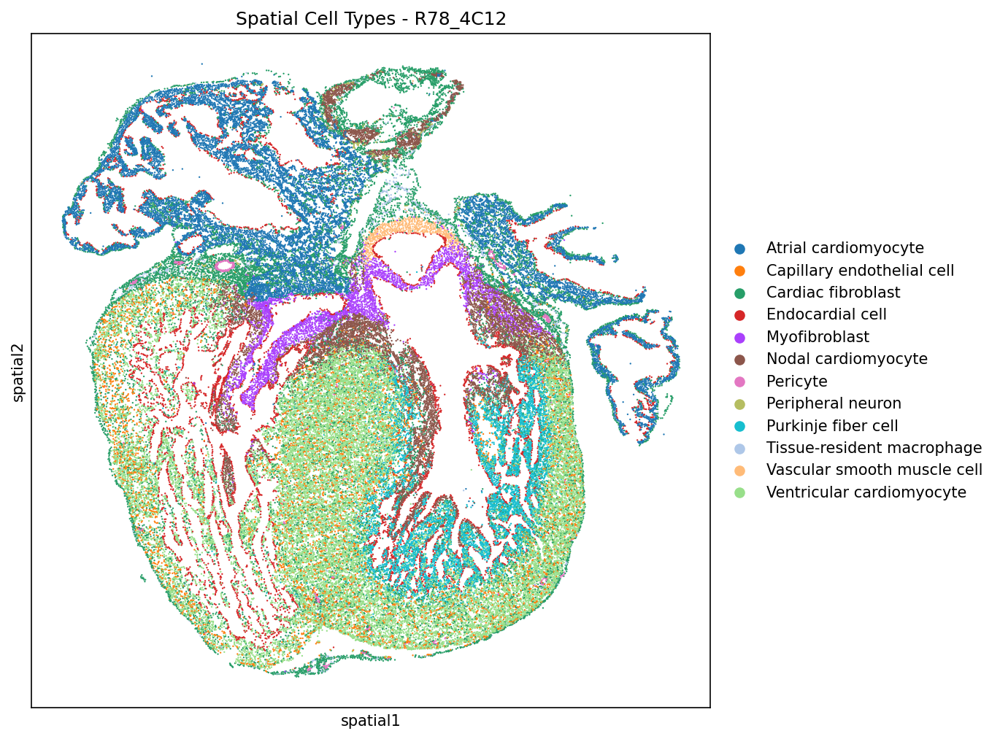

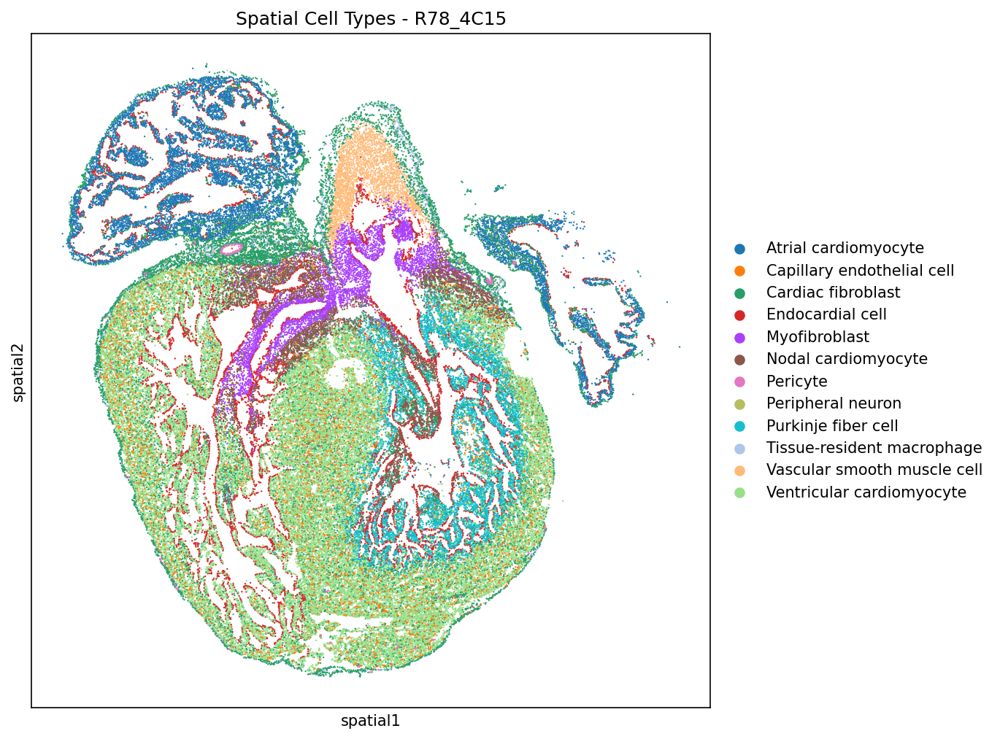

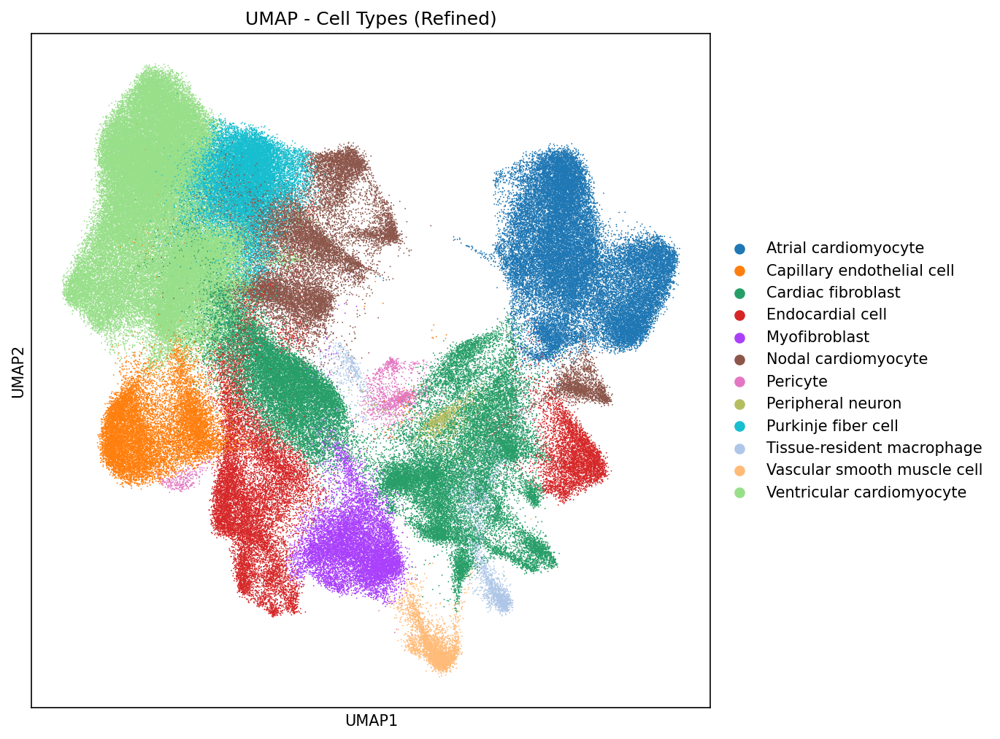

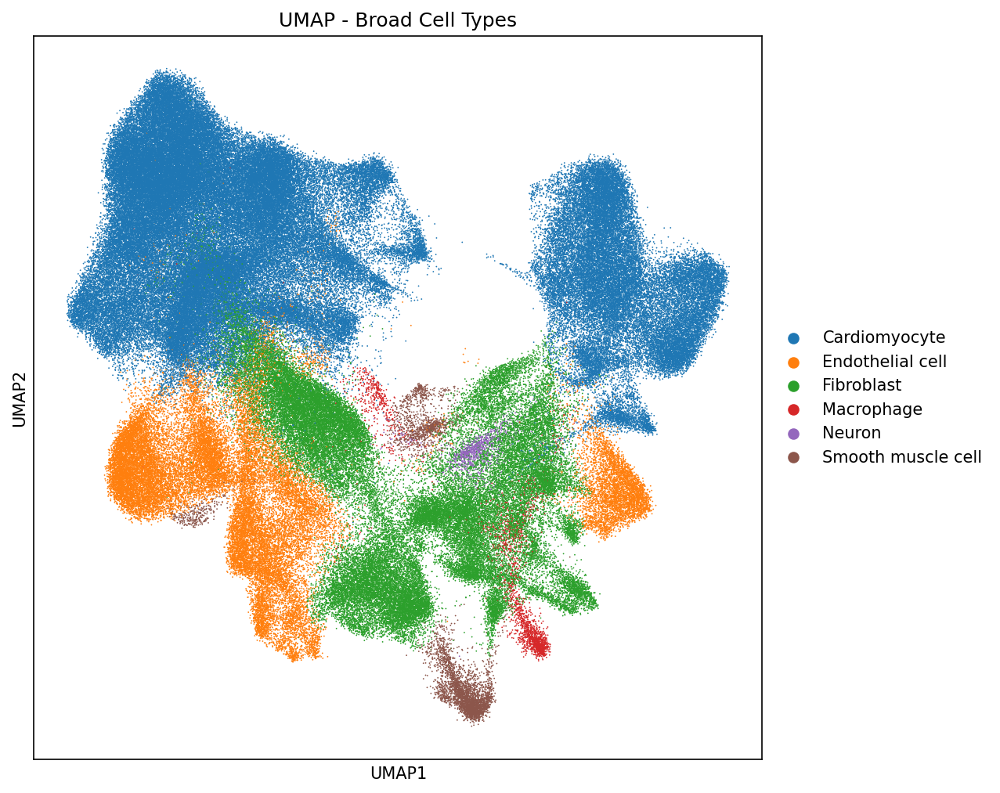

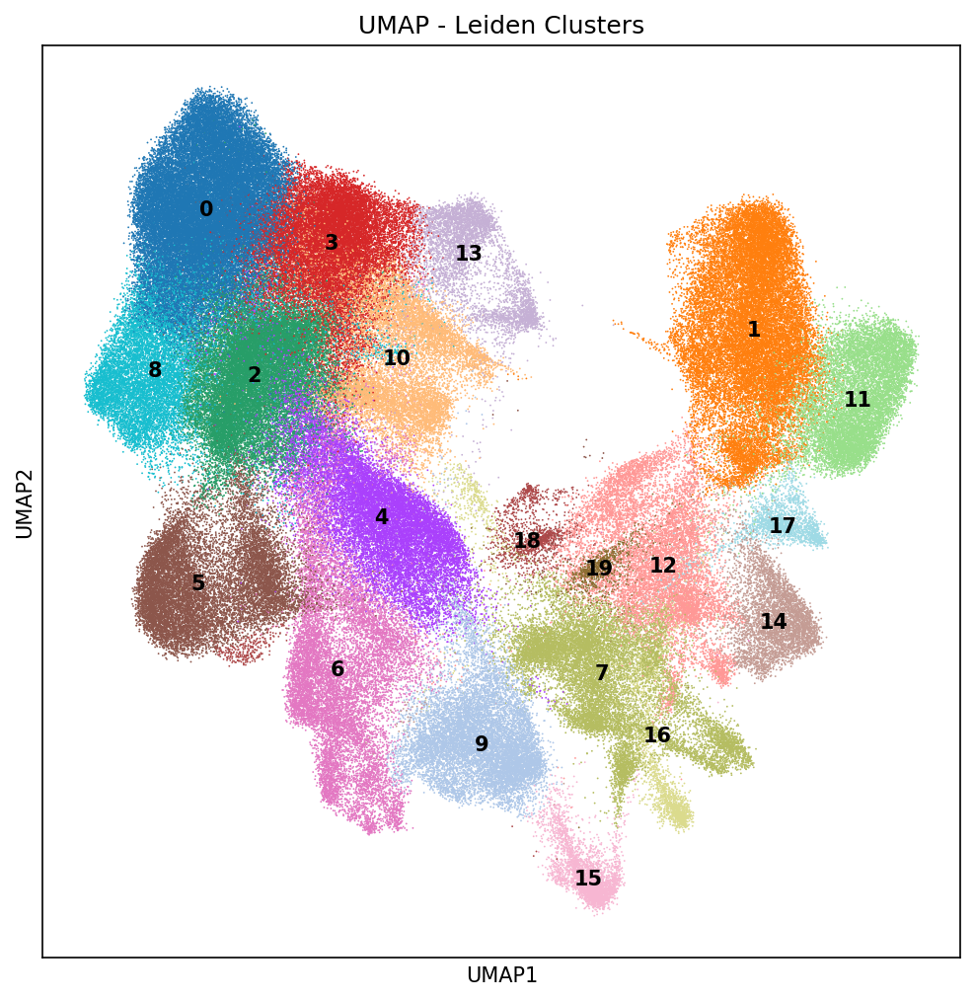

🔍 Interpreting 6 figure(s)...
<observation>
Output:
Detected tissue type: heart
Auto-selecting best clustering resolution...
Selected resolution: 1.0
Found 20 clusters

--- Level 1: Assigning broad categories ---
  Cluster 0: Cardiomyocyte
  Cluster 1: Cardiomyocyte
  Cluster 2: Cardiomyocyte
  Cluster 3: Cardiomyocyte
  Cluster 4: Fibroblast
  Cluster 5: Endothelial cell
  Cluster 6: Endothelial cell
  Cluster 7: Fibroblast
  Cluster 8: Cardiomyocyte
  Cluster 9: Fibroblast
  Cluster 10: Cardiomyocyte
  Cluster 11: Cardiomyocyte
  Cluster 12: Fibroblast
  Cluster 13: Cardiomyocyte
  Cluster 14: Endothelial cell
  Cluster 15: Smooth muscle cell
  Cluster 16: Macrophage
  Cluster 17: Cardiomyocyte
  Cluster 18: Smooth muscle cell
  Cluster 19: Neuron

--- Level 2: Refining to subtypes ---
  Cluster 0: Ventricular cardiomyocyte
  Cluster 1: Atrial cardiomyocyte
  Cluster 2: Ventricular cardiomyocyte
  Cluster 3: Purkinje fiber cell
  Cluster 8: Ventricular cardiomyocyte
  Cluster 10: Nod

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

  0%|          | 0/3 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


📊 Displaying 3 figure(s)...


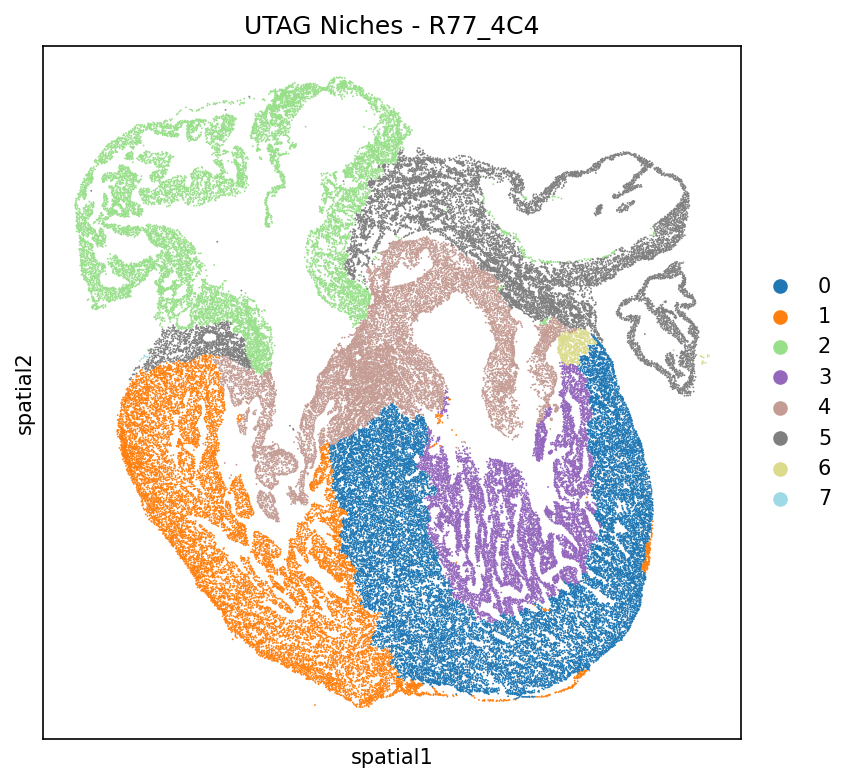

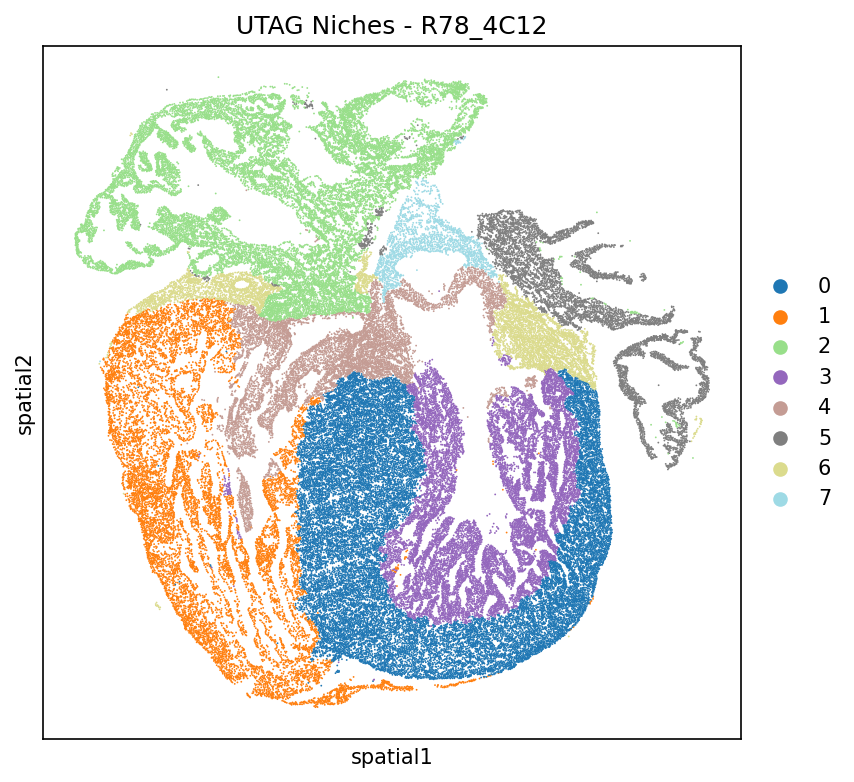

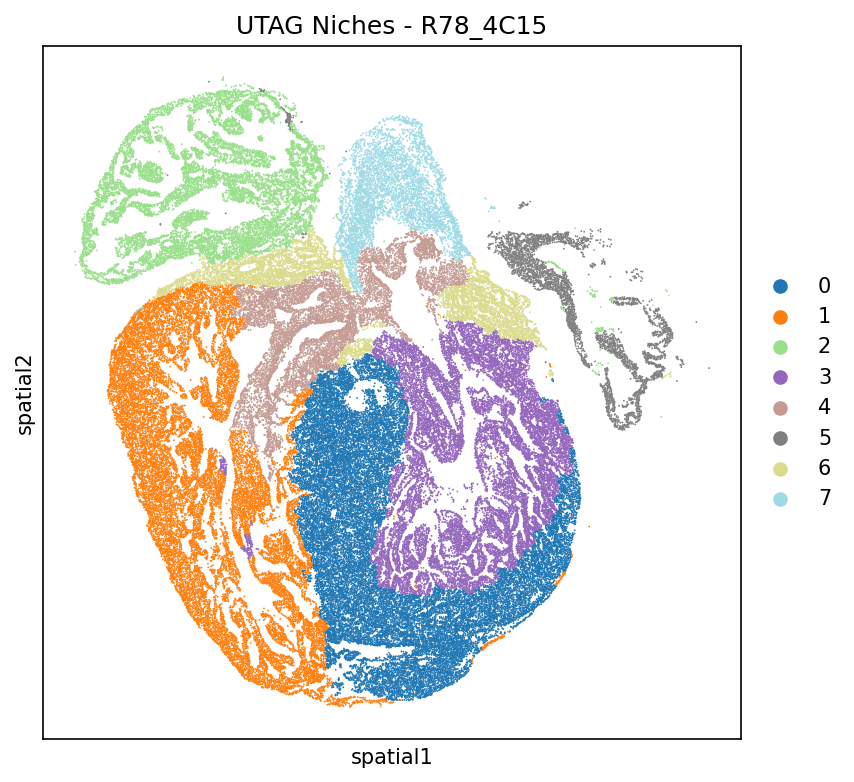

🔍 Interpreting 3 figure(s)...
<observation>
Output:
Auto-estimated max_dist: 40
Trying UTAG with resolution=0.05...
Applying UTAG Algorithm...
Running UMAP on Input Dataset...
Applying Leiden Clustering at Resolution: 0.05...
  Found 12 niches
Successfully ran UTAG clustering (per sample: sample_id). Found 8 niches using UTAG Label_leiden_0.05. Saved to /home/wangh256/hanchen/Agent_dev/spatialagent_dev_agx/experiments/test_annotation_new/utag_main_result.csv
100%|##########| 1/1 [01:41<00:00, 102.00s/it]


## Auto-Generated Figure Analysis

### Figure Interpretation: utag_niche_R77_4C4.png
## Visual Observations

The figure displays a spatial transcriptomics map of a developing human heart tissue section (R77_4C4) with UTAG (Unsupervised Tissue Annotation and Grouping) niche clustering. The data shows:

- **8 distinct spatial niches** (labeled 0-7) represented by different colors
- **Clear anatomical structure** resembling a heart cross-section with visible chambers
- **Spatial organiz

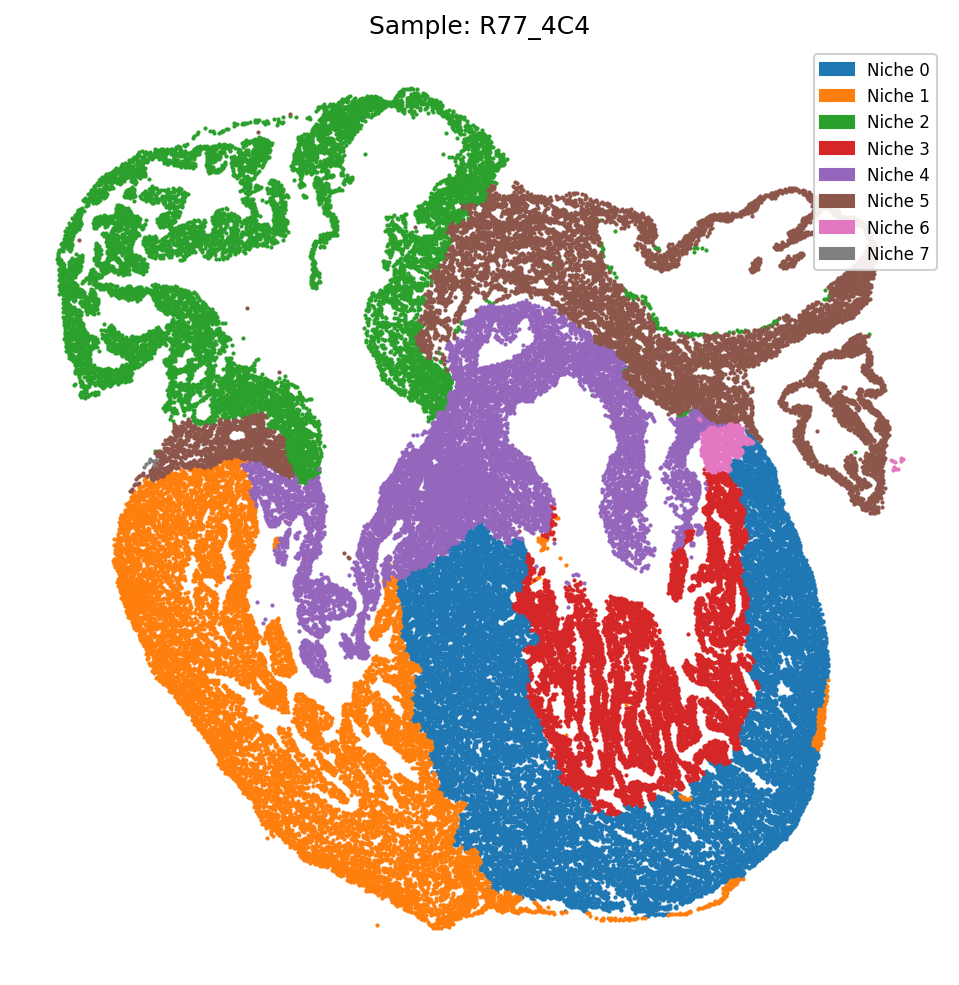

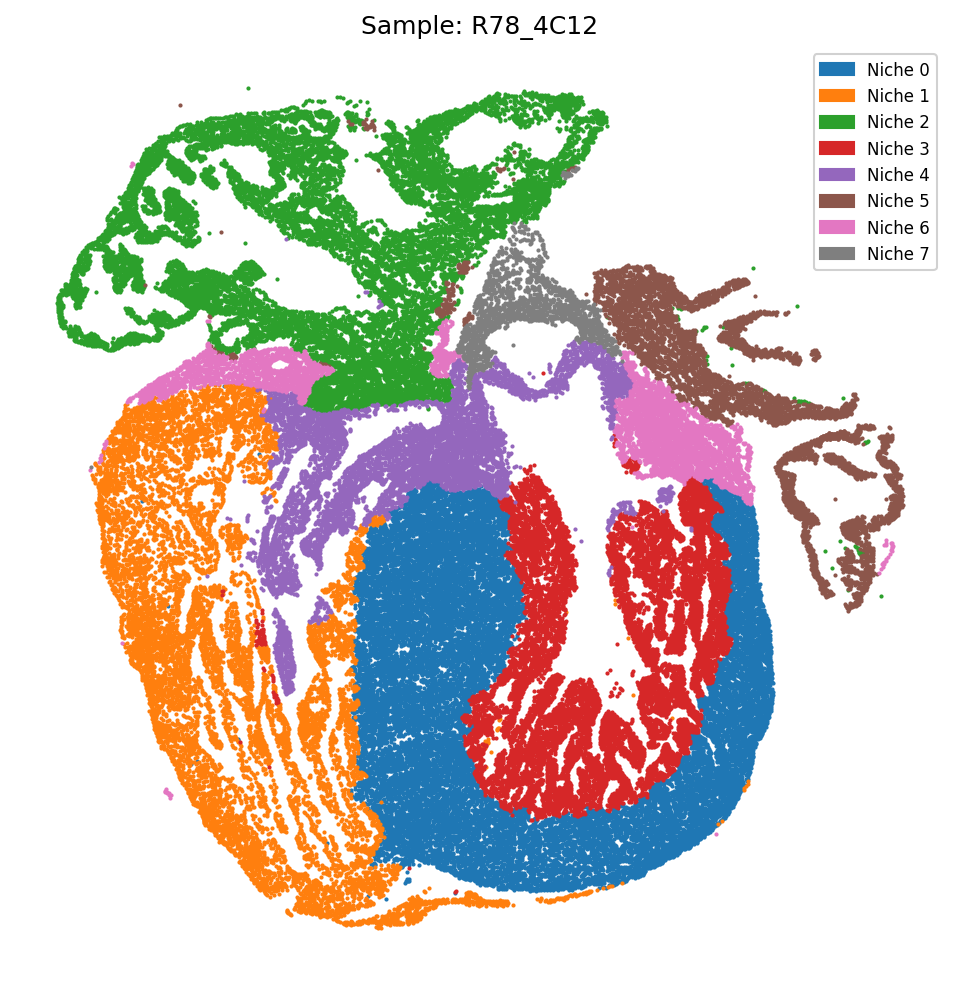

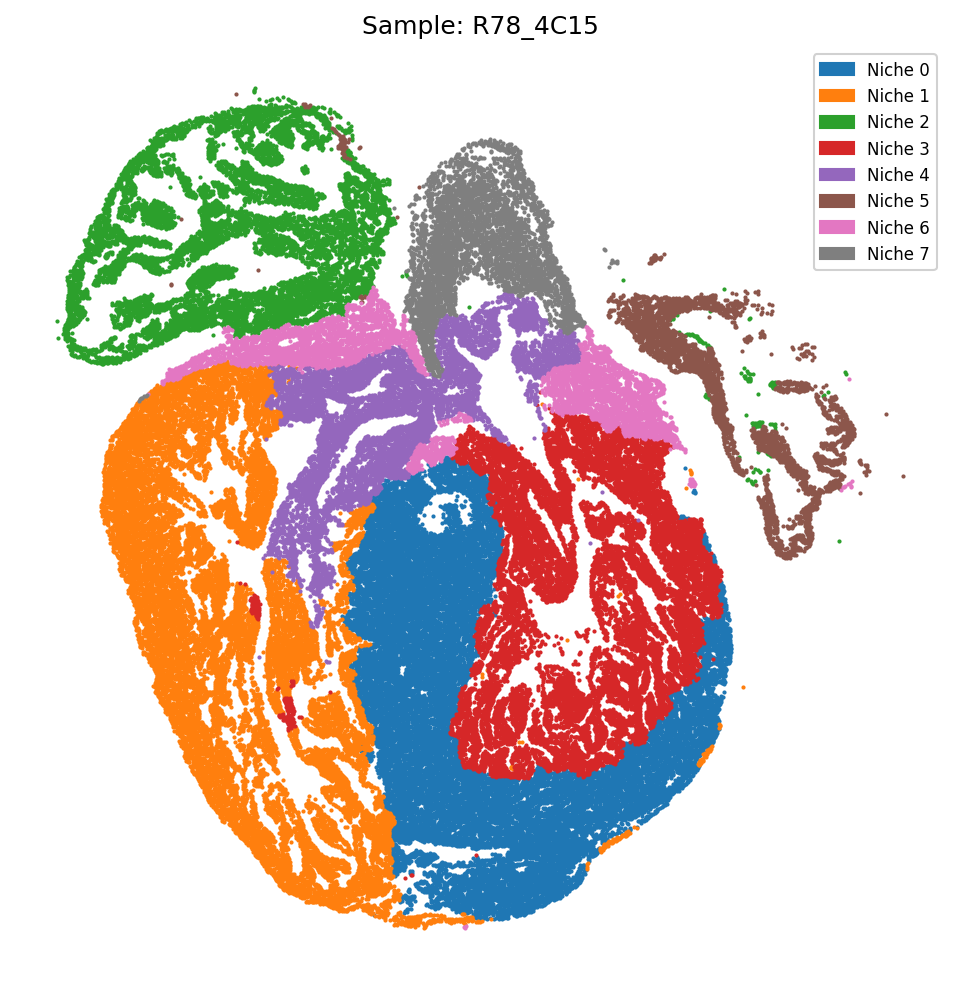

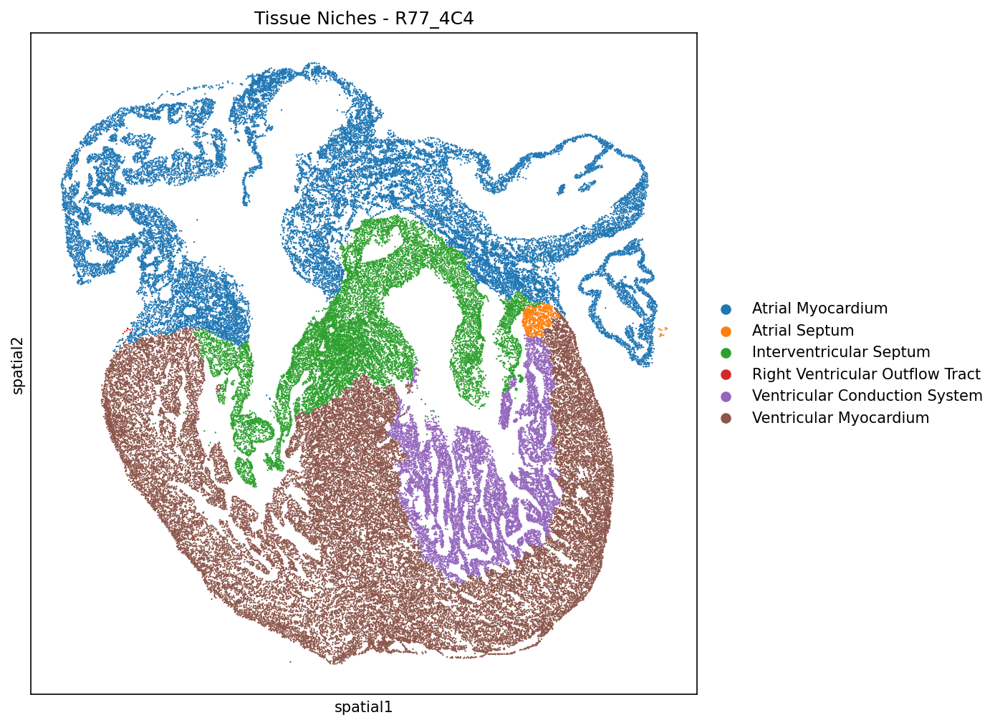

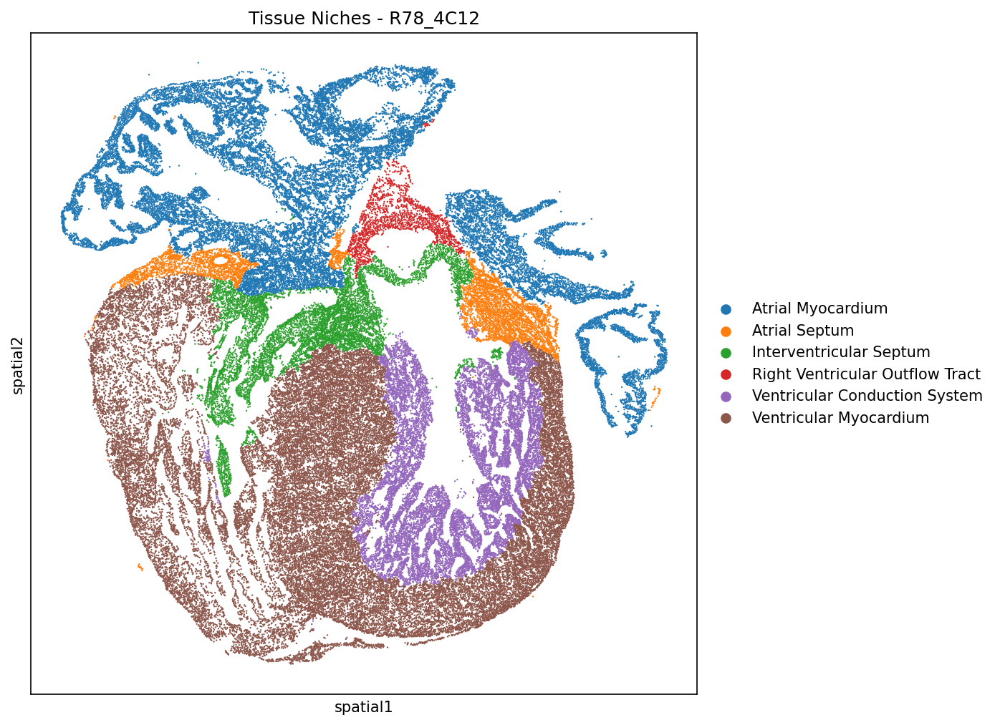

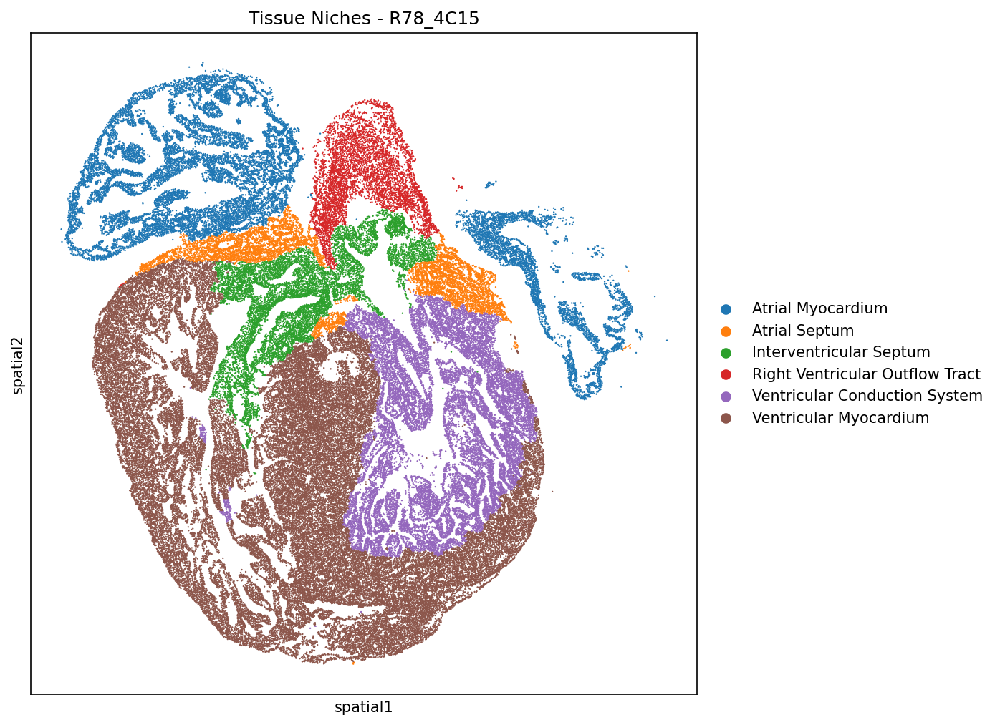

🔍 Interpreting 6 figure(s)...
<observation>
Output:
Using UTAG column: UTAG Label_leiden_0.05

--- Annotating sample: R77_4C4 (batch mode) ---
  Niche 0: Left Ventricle
  Niche 1: Right Ventricle
  Niche 2: Right Atrium
  Niche 3: Left Ventricular Conduction System
  Niche 4: Interventricular Septum
  Niche 5: Left Atrium
  Niche 6: Atrioventricular Node
  Niche 7: Right Ventricular Free Wall

--- Annotating sample: R78_4C12 (batch mode) ---
  Niche 0: Right Ventricular Myocardium
  Niche 1: Left Ventricular Myocardium
  Niche 2: Left Atrial Myocardium
  Niche 3: Right Ventricular Conduction System
  Niche 4: Interventricular Septum
  Niche 5: Right Atrial Myocardium
  Niche 6: Atrial Septum
  Niche 7: Outflow Tract

--- Annotating sample: R78_4C15 (batch mode) ---
  Niche 0: Left Ventricle
  Niche 1: Right Ventricle
  Niche 2: Right Atrium
  Niche 3: Left Ventricular Conduction System
  Niche 4: Atrioventricular Junction
  Niche 5: Left Atrium
  Niche 6: Interatrial Septum
  Niche 7: 

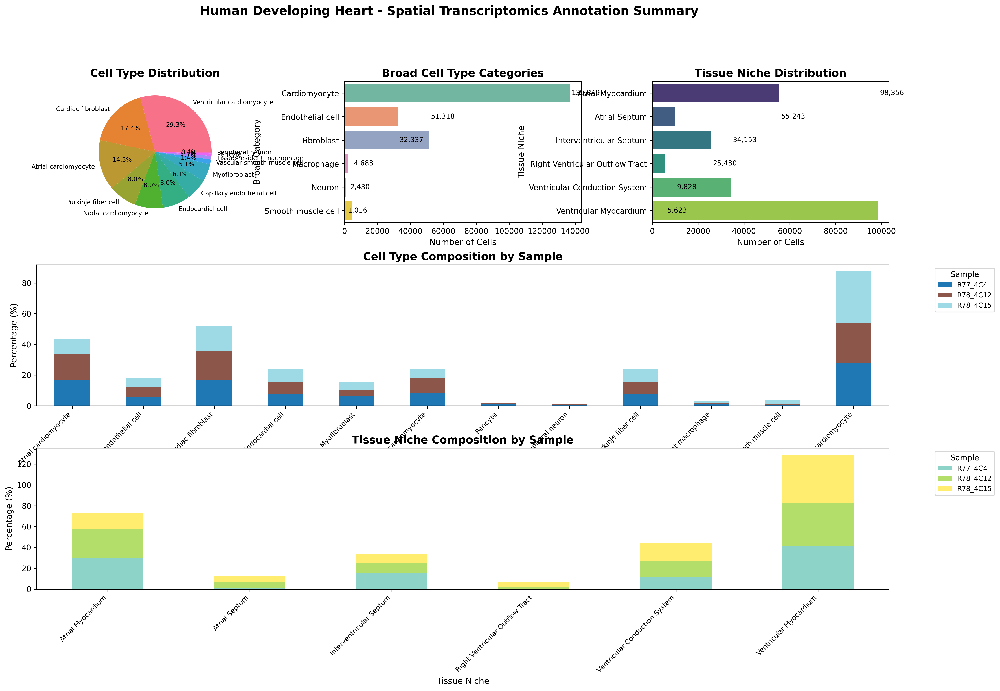

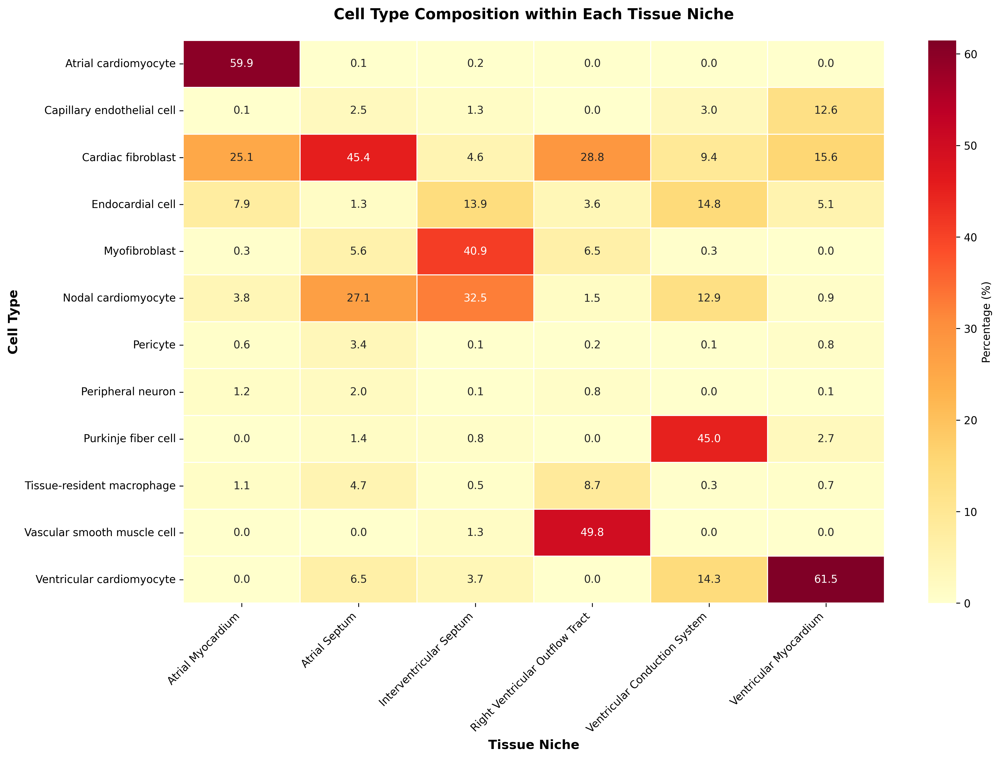

🔍 Interpreting 2 figure(s)...
<observation>
Output:
Summary figure saved to: /home/wangh256/hanchen/Agent_dev/spatialagent_dev_agx/experiments/test_annotation_new/annotation_summary.png
Cell type x niche heatmap saved to: /home/wangh256/hanchen/Agent_dev/spatialagent_dev_agx/experiments/test_annotation_new/celltype_niche_heatmap.png

✓ All summary visualizations created successfully!


## Auto-Generated Figure Analysis

### Figure Interpretation: annotation_summary.png
## Visual Observations

This comprehensive annotation summary contains four main visualization components:

1. **Cell Type Distribution (Pie Chart)**: Shows 13 distinct cell types with ventricular cardiomyocytes dominating at 29.3%, followed by cardiac fibroblasts (17.4%) and atrial cardiomyocytes (14.5%). Smaller populations include endocardial cells, nodal cardiomyocytes, Purkinje fiber cells, and various other cardiac cell types.

2. **Broad Cell Type Categories (Bar Chart)**: Consolidates cell types into major catego

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃                                   Spatial Transcriptomics Annotation Complete                                   ┃
┗━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┛

I have successfully annotated the developing human heart MERFISH spatial transcriptomics data. Here's a            
comprehensive summary of the results:                                                                              


                                                 Dataset Overview                                                  

 • Total cells: 228,633                                                                                            
 • Total genes: 238                                                                                                
 • Samples: 3 (R77_4C4, R78_4C12, R78_4C15)                                                                        
 • Tissue: Human developing heart                                                                                  


                                                Annotation Results                                                 

                                    1. Cell Type Annotation (12 distinct types)                                    

Major cell populations:                                                                                            

 • Ventricular cardiomyocytes: 66,921 cells (29.3%) - dominant contractile cells                                   
 • Cardiac fibroblasts: 39,717 cells (17.4%) - structural support and ECM                                          
 • Atrial cardiomyocytes: 33,171 cells (14.5%) - atrial chamber cells                                              
 • Purkinje fiber cells: 18,381 cells (8.0%) - specialized conduction system                                       
 • Nodal cardiomyocytes: 18,376 cells (8.0%) - pacemaker cells                                                     
 • Endocardial cells: 18,290 cells (8.0%) - chamber lining                                                         

Supporting cell types:                                                                                             

 • Capillary endothelial cells, myofibroblasts, vascular smooth muscle cells, pericytes, tissue-resident           
   macrophages, peripheral neurons                                                                                 

Broad categories:                                                                                                  

 • Cardiomyocytes: 59.9% (136,849 cells)                                                                           
 • Fibroblasts: 22.4% (51,318 cells)                                                                               
 • Endothelial cells: 14.1% (32,337 cells)                                                                         
 • Smooth muscle cells: 2.1%                                                                                       
 • Macrophages: 1.1%                                                                                               
 • Neurons: 0.4%                                                                                                   

                                 2. Tissue Niche Annotation (6 anatomical regions)                                 

Using the anatomical reference image, I identified:                                                                

 • Ventricular Myocardium: 98,356 cells (43.0%) - main ventricular muscle                                          
 • Atrial Myocardium: 55,243 cells (24.2%) - atrial chambers                                                       
 • Ventricular Conduction System: 34,153 cells (14.9%) - electrical pathways                                       
 • Interventricular Septum: 25,430 cells

</conclude>



💰 Cost Summary (claude-sonnet-4-5-20250929)
Total calls:    14
Input tokens:   218,041
Output tokens:  6,563
Total tokens:   224,604
Total cost:     $0.7526



In [4]:
# Simple query - let the skill guide the workflow
query = f"""
Annotate the spatial transcriptomics data at '{ADATA_PATH}'.

This is {SPECIES} {TISSUE} data ({CONDITION}).
Anatomical reference image: '{ANATOMICAL_IMAGE}'

Save results to '{test_save_path}'.
"""

print("Running annotation workflow...")
print("=" * 60)

result = agent.run(query, config={"thread_id": "annotation"})

## 5. Verify Results

In [5]:
import os
import pandas as pd

print("Generated files:")
print("=" * 50)

files_found = []
for root, dirs, files in os.walk(test_save_path):
    level = root.replace(test_save_path, '').count(os.sep)
    indent = '  ' * level
    print(f"{indent}{os.path.basename(root)}/")
    for file in files:
        filepath = os.path.join(root, file)
        size = os.path.getsize(filepath)
        print(f"{indent}  {file} ({size:,} bytes)")
        files_found.append(filepath)

if not files_found:
    print("  (no files generated)")

Generated files:
test_annotation_new/
  spatial_celltype_R78_4C15.png (1,094,936 bytes)
  composite_niches_R78_4C15.png (222,105 bytes)
  composite_niches_R78_4C12.png (258,408 bytes)
  celltype_annotated.h5ad (178,882,312 bytes)
  celltype_annotations.csv (1,460 bytes)
  celltype_transferred.csv (8,495,332 bytes)
  niche_annotations.csv (481 bytes)
  celltype_niche_heatmap.png (478,729 bytes)
  utag_niche_R78_4C12.png (600,741 bytes)
  utag_niche_R77_4C4.png (620,098 bytes)
  utag_clustered.h5ad (382,851,964 bytes)
  niche_spatial_R78_4C15.png (1,004,618 bytes)
  composite_niches_R77_4C4.png (260,867 bytes)
  niche_annotations_per_sample.json (2,237 bytes)
  niche_spatial_R78_4C12.png (1,074,650 bytes)
  annotation_summary.png (891,799 bytes)
  umap_leiden.png (932,978 bytes)
  umap_celltype_broad.png (970,409 bytes)
  umap_celltype.png (1,036,969 bytes)
  observation_log.jsonl (38,564 bytes)
  utag_niche_R78_4C15.png (556,054 bytes)
  spatial_celltype_R78_4C12.png (1,154,653 bytes)
 

In [6]:
# Check for cell type annotation results
celltype_csv_path = os.path.join(test_save_path, "celltype_annotations.csv")
celltype_h5ad_path = os.path.join(test_save_path, "celltype_annotated.h5ad")

if os.path.exists(celltype_csv_path):
    print("Cell type annotations found!")
    print("=" * 50)
    df = pd.read_csv(celltype_csv_path)
    print(f"Clusters annotated: {len(df)}")
    print(f"Columns: {df.columns.tolist()}")
    print(f"\nAnnotations:")
    print(df.to_string(index=False))
else:
    print("Cell type annotation CSV not found at expected path.")
    print("Checking for alternative annotation files...")
    for f in files_found:
        if 'celltype' in f.lower() or 'annotation' in f.lower():
            print(f"  Found: {f}")

if os.path.exists(celltype_h5ad_path):
    print(f"\nAnnotated h5ad exists: {celltype_h5ad_path}")

Cell type annotations found!
Clusters annotated: 20
Columns: ['cluster', 'broad_category', 'cell_type', 'markers']

Annotations:
 cluster     broad_category                   cell_type                             markers
       0      Cardiomyocyte   Ventricular cardiomyocyte        HEY2, MYH7, FZD1, RRAD, IRX4
       1      Cardiomyocyte        Atrial cardiomyocyte      PAM, MYH6, TBX5, COL2A1, NR2F1
       2      Cardiomyocyte   Ventricular cardiomyocyte     PPP1R12B, LBH, NAV1, DES, CASQ2
       3      Cardiomyocyte         Purkinje fiber cell       IRX3, SCN5A, MYH7, IRX4, GJA1
       4         Fibroblast          Cardiac fibroblast    DCN, TCF21, SCN7A, COL15A1, HHIP
       5   Endothelial cell  Capillary endothelial cell COL15A1, CD34, MCAM, NOTCH1, IGFBP4
       6   Endothelial cell            Endocardial cell     ECE1, CGNL1, POSTN, NOTCH1, FN1
       7         Fibroblast          Cardiac fibroblast      DCN, TCF21, COL14A1, OSR1, FN1
       8      Cardiomyocyte   Ventricular c

In [7]:
# Check for niche clustering results
niche_csv_path = os.path.join(test_save_path, "niche_annotations.csv")
niche_h5ad_path = os.path.join(test_save_path, "niche_annotated.h5ad")
utag_path = os.path.join(test_save_path, "utag_main_result.csv")

for path, name in [(utag_path, "UTAG clusters"), (niche_csv_path, "Niche annotations")]:
    if os.path.exists(path):
        print(f"\n{name} found!")
        print("=" * 50)
        df = pd.read_csv(path)
        print(f"Rows: {len(df)}")
        print(f"Columns: {df.columns.tolist()}")
        if len(df) < 20:
            print(df.to_string(index=False))
        else:
            print(df.head(10))
    else:
        print(f"\n{name} not found at: {path}")

if os.path.exists(niche_h5ad_path):
    print(f"\nNiche annotated h5ad exists: {niche_h5ad_path}")


UTAG clusters found!
Rows: 228633
Columns: ['Unnamed: 0', 'sample_id', 'batch', 'cell_type', 'n_genes', 'n_counts', 'leiden_0.3', 'leiden_0.5', 'leiden_0.8', 'leiden_1.0', 'leiden', 'transferred_celltype', 'cell_type_broad', 'UTAG Label_leiden_0.05', 'utag']
        Unnamed: 0 sample_id    batch                   cell_type  n_genes  \
0       10-R77_4C4   R77_4C4  R77_4C4               Myofibroblast       42   
1      100-R77_4C4   R77_4C4  R77_4C4               Myofibroblast       77   
2  1000010-R77_4C4   R77_4C4  R77_4C4          Cardiac fibroblast       54   
3  1000016-R77_4C4   R77_4C4  R77_4C4   Ventricular cardiomyocyte       62   
4  1000017-R77_4C4   R77_4C4  R77_4C4          Cardiac fibroblast       84   
5  1000019-R77_4C4   R77_4C4  R77_4C4  Capillary endothelial cell       78   
6  1000020-R77_4C4   R77_4C4  R77_4C4   Ventricular cardiomyocyte       57   
7  1000021-R77_4C4   R77_4C4  R77_4C4         Purkinje fiber cell       62   
8  1000022-R77_4C4   R77_4C4  R77_4C4 

## 6. Verify Skill Retrieval

In [ ]:
if hasattr(agent, '_selected_skill') and agent._selected_skill:
    print("Skill was retrieved and used")
    print(f"Skill preview: {agent._selected_skill[:300]}...")
else:
    print("No skill was used (agent used general planning)")

## 7. Test Summary

In [ ]:
print("\n" + "=" * 60)
print("ANNOTATION TEST SUMMARY")
print("=" * 60)

checks = {
    "Skill retrieved": hasattr(agent, '_selected_skill') and agent._selected_skill is not None,
    "Files generated": len(files_found) > 0,
}

# Check for expected output files (updated to match actual tool outputs)
expected_files = [
    "preprocessed.h5ad",
    "celltype_transferred.csv",
    "celltype_annotated.h5ad",
    "celltype_annotations.csv",
    "utag_main_result.csv",
    "niche_annotated.h5ad",
    "niche_annotations.csv",
]

for fname in expected_files:
    fpath = os.path.join(test_save_path, fname)
    checks[f"Output: {fname}"] = os.path.exists(fpath)

for check, passed in checks.items():
    status = "PASS" if passed else "FAIL"
    print(f"  [{status}] {check}")

passed_count = sum(checks.values())
total_count = len(checks)
print(f"\n{passed_count}/{total_count} checks passed")

## 8. Interactive Follow-up

Ask questions about the annotation results.

In [ ]:
# Example follow-up query
# result = agent.run("What are the main cell types identified and their markers?", config={"thread_id": "annotation"})

## Summary

This test verifies the annotation workflow guided by the `annotation` skill:

1. Preprocess spatial data
2. Find and download scRNA-seq reference from CZI
3. Transfer cell type labels via Harmony integration
4. Annotate cell types (two-level hierarchical approach)
5. Run UTAG spatial clustering
6. Annotate tissue niches with anatomical reference
7. Summarize results